In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
import json
import pywt
import scipy
from collections import Counter


from Modules.Feature_Extraction_temporal_domain import *

In [2]:
import warnings

warnings.filterwarnings("ignore")

## Read Preprocessed Data

In [3]:
def read_csv(filepath):
    f = open(filepath)
    data = json.load(f)
    return data

ecg = read_csv('Preprocessed_data/ecg/ecg_unfiltered.txt')
ecg_filt = read_csv('Preprocessed_data/ecg/ecg_filtered.txt')

### Crop segments of the signals to remove a few minutes from the start and end
At the very beginning or the end, the device is being attached? removed from the patient hence leading to a high variance in signals

In [4]:
#remove first and last few minutes
for patient in ecg_filt:
    ecg_filt[patient] = ecg_filt[patient][5000:700000]
    ecg[patient] = ecg[patient][5000:700000]

### Divide signals from patients into chunks of 20 seconds

In [5]:
sampling_rate = 62
duration = int(20*sampling_rate)

def split_signal_into_segments(duration, ecg_filt):
    segments_ecg = []

    for patient in ecg_filt:
        values = ecg_filt[patient]
        for i in range(0,len(values) - duration + 1, duration):
            segments_ecg.append(values[i : (i + duration)])

    return segments_ecg

segments_ecg = split_signal_into_segments(duration, ecg_filt)

In [6]:
def split_signal_into_segments_2(duration, ecg_filt):
    segments_ecg = []

    values = ecg_filt
    for i in range(0,len(values) - duration + 1, duration):
        segments_ecg.append(values[i : (i + duration)])

    return segments_ecg

# Feature Extraction using Wavelet Transform

In [7]:
def calculate_entropy(list_values):
    counter_values = Counter(list_values).most_common()
    probabilities = [elem[1]/len(list_values) for elem in counter_values]
    entropy=scipy.stats.entropy(probabilities)
    return entropy

def calculate_statistics(list_values):
    n5 = np.nanpercentile(list_values, 5)
    n25 = np.nanpercentile(list_values, 25)
    n75 = np.nanpercentile(list_values, 75)
    n95 = np.nanpercentile(list_values, 95)
    median = np.nanpercentile(list_values, 50)
    mean = np.nanmean(list_values)
    std = np.nanstd(list_values)
    var = np.nanvar(list_values)
    rms = np.nanmean(np.sqrt(list_values**2))
    return [n5, n25, n75, n95, median, mean, std, var, rms]

def calculate_crossings(list_values):
    zero_crossing_indices = np.nonzero(np.diff(np.array(list_values) > 0))[0]
    no_zero_crossings = len(zero_crossing_indices)
    mean_crossing_indices = np.nonzero(np.diff(np.array(list_values) > np.nanmean(list_values)))[0]
    no_mean_crossings = len(mean_crossing_indices)
    return [no_zero_crossings, no_mean_crossings]

def get_features(list_values):
    entropy = calculate_entropy(list_values)
    crossings = calculate_crossings(list_values)
    statistics = calculate_statistics(list_values)
    return [entropy] + crossings + statistics

In [8]:
def get_ecg_features(ecg_data, waveletname):
    list_features = []
    for signal in ecg_data:
        list_coeff = pywt.wavedec(signal, waveletname)
        features = []
        for coeff in list_coeff:
            features += get_features(coeff)
        list_features.append(features)
    return list_features

In [9]:
features = get_ecg_features(segments_ecg, 'db4')
features = pd.DataFrame(features)

# Initial Clustering using DBSCAN
This first sampling will remove samples that are either empty or extremely erroneous

In [10]:
clustering = DBSCAN(eps=40, min_samples=3).fit(features)
DBSCAN_dataset = features.copy()
DBSCAN_dataset.loc[:,'Cluster'] = clustering.labels_

clusters = DBSCAN_dataset.Cluster.value_counts().to_frame()
clusters

,Cluster
0,9239
-1,42
2,19
1,13
3,3


#### Now we keep only the samples which were in the majority class of the first clustering

In [11]:
y_pred = clustering.fit_predict(features)

anomoly_indices = np.where(y_pred == 0)[0]

anomolous_signals = np.take(features, anomoly_indices, 0)

In [12]:
first_clustering_normal_signals = [segments_ecg[i] for i in anomoly_indices]

# Clustering to find anomalous segments within samples

In [17]:
def find_anomalies_using_DBSCAN(segment, num, sampling_rate, duration):
    epochs = split_signal_into_segments_2(duration, segment)
    features = get_ecg_features(epochs, 'db4')
    features = pd.DataFrame(features)
    clustering = DBSCAN(eps=7, min_samples=3).fit(features)
    DBSCAN_dataset = features.copy()
    DBSCAN_dataset.loc[:,'Cluster'] = clustering.labels_

    clusters = DBSCAN_dataset.Cluster.value_counts().to_frame()
    clusters
    y_pred = clustering.fit_predict(features)

    anomoly_indices = np.where(y_pred == -1)[0]

    anomolous_signals = np.take(features, anomoly_indices, 0)

    fig, ax = plt.subplots()

    ax.set_title("Anomolous signals")
    ax.set_xlabel("Time (seconds)")
    t = np.arange(0,int(20*sampling_rate))

    ax.plot(t,segment, color = "blue")
    for i in range(len(anomoly_indices)):
        start = anomoly_indices[i]*duration
        ax.plot(t[start:start+duration],segment[start:start+duration], color = "red")

    plt.savefig('anomalies_clustering/WVT/'+str(num)+'.png')

    return anomoly_indices, anomolous_signals, clusters, features

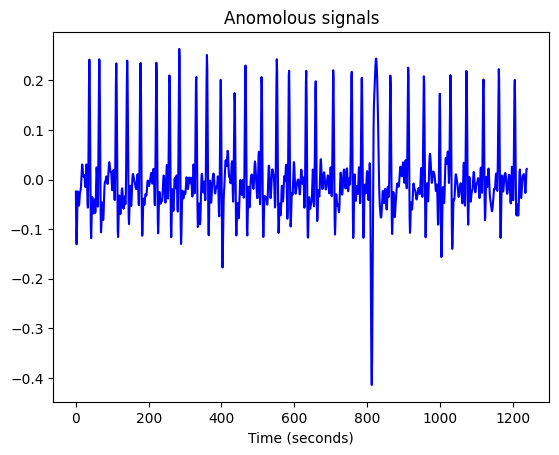

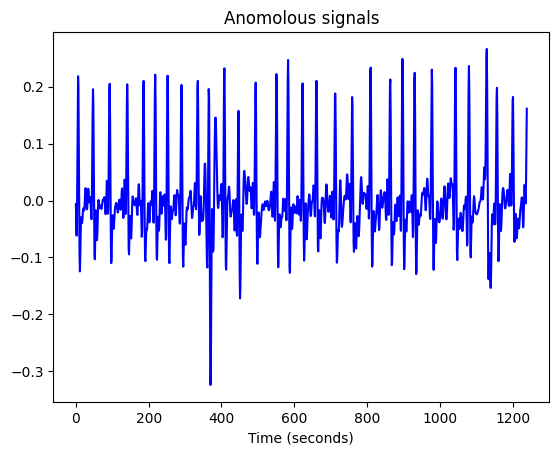

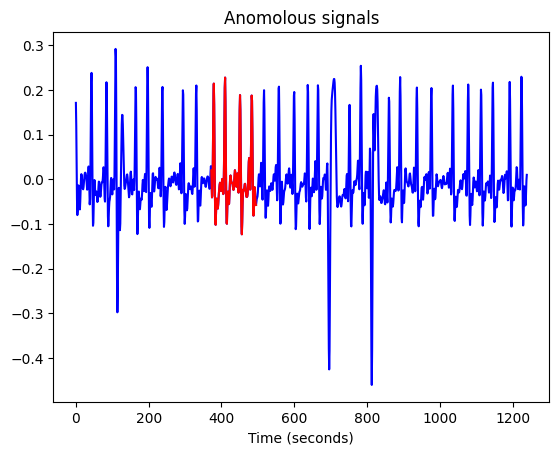

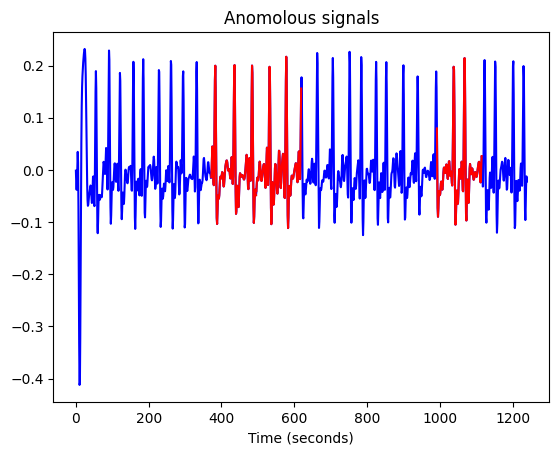

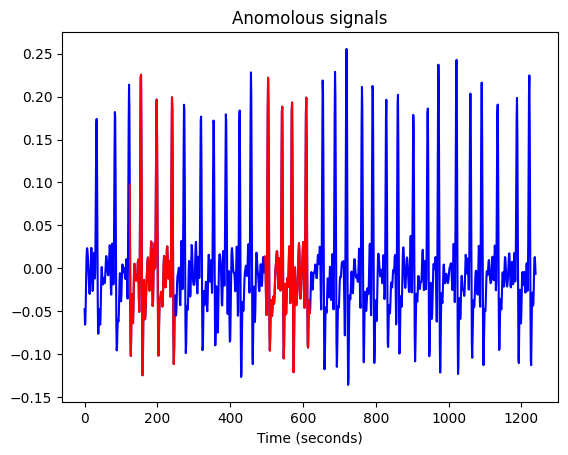

...

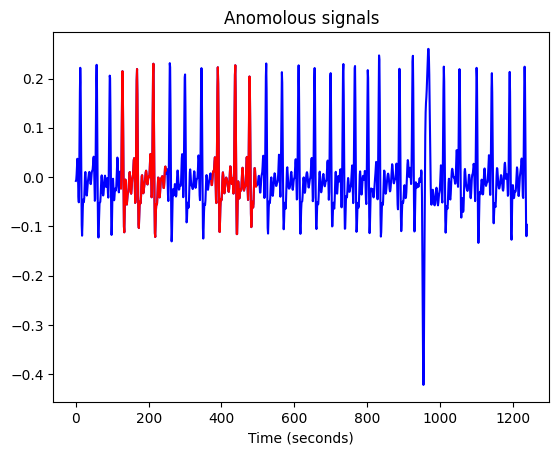

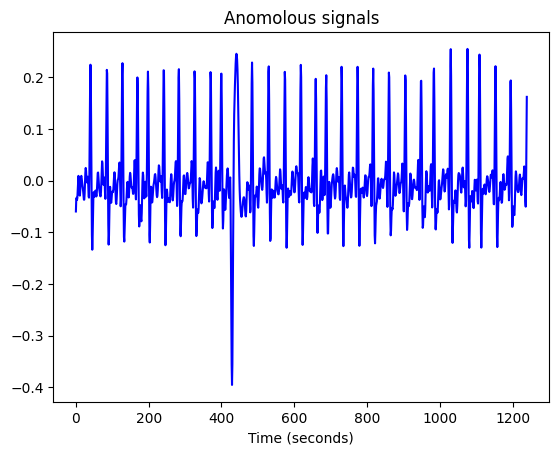

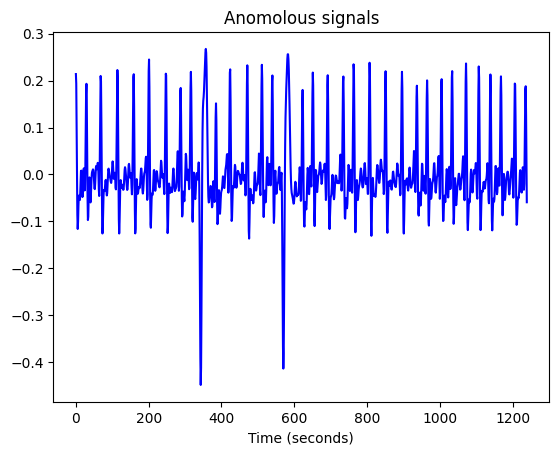

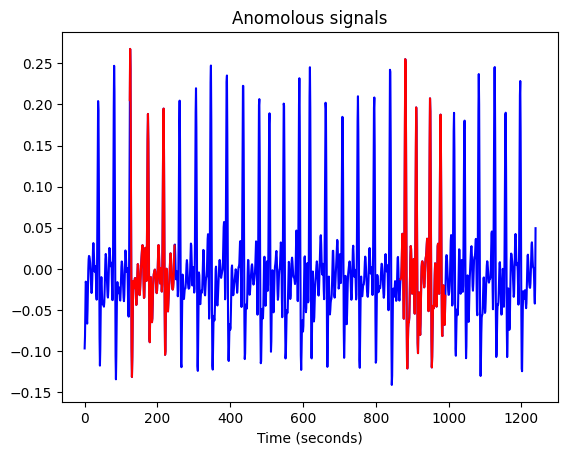

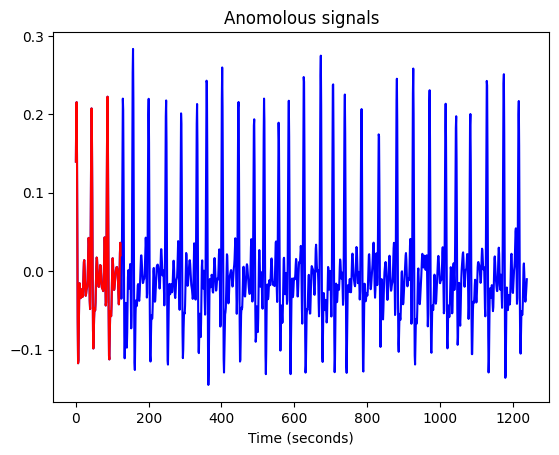

In [18]:
sampling_rate = 62
for i in range(300):
    anomoly_indices, anomolous_signals, clusters, features = find_anomalies_using_DBSCAN(first_clustering_normal_signals[i], i, sampling_rate, int(2*62))
